# Capstone Project: Malacious URL detection using Machine Learning and Artificial Intelligence


This notebook should go through the features present within the  [Kaggle Dataset](https://www.kaggle.com/datasets/sid321axn/malicious-urls-dataset) which is derived from the ISCX-URL-2016 dataset and analyze the classification distributions in an attempt to explain the performance of the models presented in other notebooks in this project.

This is the first Jupitar Notebook the project is divided over 5 Notebook appended with numbers.

### CRISP-DM Framework


The Cross Industry Standard Process for Data Mining (CRISP-DM) is a process model that serves as the base for a data science process. It has six sequential phases:
The project was organized as per the below the CRISP-DM Framework phases

- Business understanding – What does the business need?
- Data understanding – What data do we have / need? Is it clean?
- Data preparation – How do we organize the data for modelling?
- Modelling – What modelling techniques should we apply?
- Evaluation – Which model best meets the business objectives?
- Deployment – How do stakeholders access the results?



### Business Understanding

**Overview**: The Web has long become a major platform for online criminal activities. URLs are used as the main vehicle in this domain. To counter this issues security community focused its efforts on developing techniques for mostly blacklisting of malicious URLs. While successful in protecting users from known malicious domains, this approach only solves part of the problem. The new malicious URLs that sprang up all over the web in masses commonly get a head start in this race. . In this project I explored a lightweight approach to detection and categorization of the malicious URLs according to their attack type and show that lexical analysis is effective and efficient for proactive detection of these URLs.


### Import libraries

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go

pio.renderers.default = "notebook"
import time
import warnings
import os 
import glob
import itertools
import re
import tldextract
from colorama import Fore
from urllib.parse import urlparse
import sys
import time
from sklearn.utils import shuffle
from pandas.plotting import scatter_matrix
from sklearn.utils.multiclass import unique_labels
from matplotlib import pyplot as plt
from sklearn.utils import shuffle
from pandas.plotting import scatter_matrix

# Ignore warnings
warnings.filterwarnings('ignore')

## Data Understanding
#### Dataset Overview
The Malicious URL dataset was taken from [Kaggle Dataset](https://www.kaggle.com/datasets/sid321axn/malicious-urls-dataset) The dataset include a large number of examples of Malicious URLs so that a machine learning-based model can be developed to identify malicious urls and stop them in advance before infecting computer system or spreading through inteinternet.

#### Collect Initial Data
This dataset has been created by combining a number of a different datasets together such as ISCx-URL2016,faizan git repo and from bad URL reporting sites such as PhishTank.


#### Describe Data
The dataset consists of 651,191 URLs, out of which 428103 benign or safe URLs, 96457 defacement URLs, 94111 phishing URLs, and 32520 malware URLs. It has two columns comprising of url and a type which signifies the class of maliciousness

#### Load Dataset -

Use pandas to read in the dataset 'Malware_dataset.csv'

In [6]:
#Collect Initial Data
df = pd.read_csv('../data/maliciousurl_input.csv')


####  Explore & Summarize the Dataset
- check dimensions of the dataset
- peek at the data
- see the statistical summary of the attributes
- breakdown the data by the class

In [7]:
df.head()

,url,type
0,br-icloud.com.br,phishing
1,mp3raid.com/music/krizz_kaliko.html,benign
2,bopsecrets.org/rexroth/cr/1.htm,benign
3,http://www.garage-pirenne.be/index.php?option=...,defacement
4,http://adventure-nicaragua.net/index.php?optio...,defacement


In [8]:
# dimension of the dataset
df.shape

(651191, 2)

In [9]:
# see all the attributes
df.columns

Index(['url', 'type'], dtype='object')

In [10]:
# check data types
df.dtypes

url     object
type    object
dtype: object

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 651191 entries, 0 to 651190
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   url     651191 non-null  object
 1   type    651191 non-null  object
dtypes: object(2)
memory usage: 9.9+ MB


In [12]:
# statistical summary
df.describe()

,url,type
count,651191,651191
unique,641119,4
top,http://style.org.hc360.com/css/detail/mysite/s...,benign
freq,180,428103


Understanding the Features

1. url-type of urls
2. type -type of urls ['benign', 'defacement', 'phishing', 'malware]

###  Verify data 
The dataset dosen't contain null values
1. Check for Null values: No null values found 
2. Determine the unique values for each columns

In [13]:
#Checking for NaN values
df.isnull().sum()

url     0
type    0
dtype: int64

In [14]:
## sample distribution print in markdown table format
count = df.type.value_counts()
count


benign        428103
defacement     96457
phishing       94111
malware        32520
Name: type, dtype: int64

#### Extract and prepare data

Removing www from the URL

In [15]:
#Extract data
df['url'] = df['url'].replace('www.', '', regex=True)
df

,url,type
0,br-icloud.com.br,phishing
1,mp3raid.com/music/krizz_kaliko.html,benign
2,bopsecrets.org/rexroth/cr/1.htm,benign
3,http://garage-pirenne.be/index.php?option=com_...,defacement
4,http://adventure-nicaragua.net/index.php?optio...,defacement
...,...,...
651186,xbox360.ign.com/objects/850/850402.html,phishing
651187,games.teamxbox.com/xbox-360/1860/Dead-Space/,phishing
651188,gamespot.com/xbox360/action/deadspace/,phishing
651189,en.wikipedia.org/wiki/Dead_Space_(video_game),phishing


In [16]:
df.head()

,url,type
0,br-icloud.com.br,phishing
1,mp3raid.com/music/krizz_kaliko.html,benign
2,bopsecrets.org/rexroth/cr/1.htm,benign
3,http://garage-pirenne.be/index.php?option=com_...,defacement
4,http://adventure-nicaragua.net/index.php?optio...,defacement


## Data Preparation

After my initial exploration and fine tuning of the dataset, it is time to prepare,extract data  prior to modeling

#### Feature Engineering

In [17]:
#Extracting category from URL type
df['category'] = df['type']
df.head(5)

,url,type,category
0,br-icloud.com.br,phishing,phishing
1,mp3raid.com/music/krizz_kaliko.html,benign,benign
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement


In [18]:
#Create a seperate column with lenght of URL
df['url_len'] = df['url'].apply(lambda x: len(str(x)))
df.head(5)


,url,type,category,url_len
0,br-icloud.com.br,phishing,phishing,16
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235


Extract and create column domain


In [19]:
from tld import get_tld, is_tld
def process_tld(url):
    try:
        res = get_tld(url, as_object = True, fail_silently=False,fix_protocol=True)
        pri_domain= res.parsed_url.netloc
    except :
        pri_domain= None
    return pri_domain
df['domain'] = df['url'].apply(lambda i: process_tld(i))
df.head()

,url,type,category,url_len,domain
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net


#### Extract root domain 

In [20]:


def extract_root_domain(url):
    extracted = tldextract.extract(url)
    root_domain = extracted.domain
    return root_domain
df['root_domain'] = df['domain'].apply(lambda x: extract_root_domain(str(x)))
df.head()

,url,type,category,url_len,domain,root_domain
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua


Extract and create columns using special characters

In [21]:
feature_spl = ['@','?','-','=','.','#','%','+','$','!','*',',','//','/']
for a in feature_spl:
    df['count-'+a] = df['url'].apply(lambda i: i.count(a))
df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,count-.,count-#,count-%,count-+,count-$,count-!,count-*,"count-,",count-//,count-/
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,2,0,0,0,0,0,0,0,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,2,0,0,0,0,0,0,0,0,2
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,2,0,0,0,0,0,0,0,0,3
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,2,0,0,0,0,0,0,0,1,3
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,2,0,0,0,0,0,0,0,1,3


In [22]:

# urlparse():This function parses a URL into six components, returning a 6-tuple. 
def abnormal_url(url):
    hostname = urlparse(url).hostname
    hostname = str(hostname)
    match = re.search(hostname, url)
    if match:
        # print match.group()
        return 1
    else:
        # print 'No matching pattern found'
        return 0
df['abnormal_url'] = df['url'].apply(lambda i: abnormal_url(i))
df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,count-#,count-%,count-+,count-$,count-!,count-*,"count-,",count-//,count-/,abnormal_url
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,0,0,0,0,0,0,0,2,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,0,0,0,0,0,0,0,3,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,0,0,0,0,0,0,0,1,3,1
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,0,0,0,0,0,0,0,1,3,1


Extract secure URL

In [23]:
def httpSecure(url):
    htp = urlparse(url).scheme #It supports the following URL schemes: file , ftp , gopher , hdl , 
                               #http , https ... from urllib.parse
    match = str(htp)
    if match=='https':
        # print match.group()
        return 1
    else:
        # print 'No matching pattern found'
        return 0
df['count_https'] = df['url'].apply(lambda i: httpSecure(i))
df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,count-%,count-+,count-$,count-!,count-*,"count-,",count-//,count-/,abnormal_url,count_https
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,0,0,0,0,0,0,3,0,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,0,0,0,0,0,0,1,3,1,0
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,0,0,0,0,0,0,1,3,1,0


Extract non secure URL

In [24]:
def count_http(url):
    return url.count('http:')

df['count_http'] = df['url'].apply(lambda i : count_http(i))
df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,count-+,count-$,count-!,count-*,"count-,",count-//,count-/,abnormal_url,count_https,count_http
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,0,0,0,0,0,3,0,0,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,0,0,0,0,0,1,3,1,0,1
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,0,0,0,0,0,1,3,1,0,1


Count www in a URL

In [25]:
def count_www(url):
    url.count('www')
    return url.count('www')
df['count_www'] = df['url'].apply(lambda i: count_www(i))

Counts the number of digit characters in a URL

In [26]:
def digit_count(url):
    digits = 0
    for i in url:
        if i.isnumeric():
            digits = digits + 1
    return digits
df['digits_count']= df['url'].apply(lambda i: digit_count(i))
df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,count-!,count-*,"count-,",count-//,count-/,abnormal_url,count_https,count_http,count_www,digits_count
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,0,0,0,2,0,0,0,0,1
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,0,0,0,3,0,0,0,0,1
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,0,0,0,1,3,1,0,1,0,7
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,0,0,0,1,3,1,0,1,0,22


Extract Hostname Length

In [27]:
def hostname_length(url):
    return len(urlparse(url).netloc)

df['hostname_length'] = df['url'].apply(lambda i: hostname_length(i))

df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,count-*,"count-,",count-//,count-/,abnormal_url,count_https,count_http,count_www,digits_count,hostname_length
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,0,0,2,0,0,0,0,1,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,0,0,3,0,0,0,0,1,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,0,0,1,3,1,0,1,0,7,17
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,0,0,1,3,1,0,1,0,22,23


Extract suspicious words

In [28]:
def suspicious_words(url):
    match = re.search('PayPal|login|signin|bank|account|update|free|lucky|service|bonus|ebayisapi|webscr|signin|ebay|verify|identity',
                      url)
    if match:
        return 1
    else:
        return 0
df['sus_url'] = df['url'].apply(lambda i: suspicious_words(i))
df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,"count-,",count-//,count-/,abnormal_url,count_https,count_http,count_www,digits_count,hostname_length,sus_url
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,0,2,0,0,0,0,1,0,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,0,3,0,0,0,0,1,0,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,0,1,3,1,0,1,0,7,17,0
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,0,1,3,1,0,1,0,22,23,0


Counts the number of letter characters in a URL

In [29]:
def letter_count(url):
    letters = 0
    for i in url:
        if i.isalpha():
            letters = letters + 1
    return letters
df['letters_count']= df['url'].apply(lambda i: letter_count(i))
df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,count-//,count-/,abnormal_url,count_https,count_http,count_www,digits_count,hostname_length,sus_url,letters_count
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,0,0,0,13
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,2,0,0,0,0,1,0,0,29
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,3,0,0,0,0,1,0,0,25
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,1,3,1,0,1,0,7,17,0,60
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,1,3,1,0,1,0,22,23,0,199


Checks to see whether URL contains a shortening service

In [30]:
def Shortining_Service(url):
    match = re.search('bit\.ly|goo\.gl|shorte\.st|go2l\.ink|x\.co|ow\.ly|t\.co|tinyurl|tr\.im|is\.gd|cli\.gs|'
                      'yfrog\.com|migre\.me|ff\.im|tiny\.cc|url4\.eu|twit\.ac|su\.pr|twurl\.nl|snipurl\.com|'
                      'short\.to|BudURL\.com|ping\.fm|post\.ly|Just\.as|bkite\.com|snipr\.com|fic\.kr|loopt\.us|'
                      'doiop\.com|short\.ie|kl\.am|wp\.me|rubyurl\.com|om\.ly|to\.ly|bit\.do|t\.co|lnkd\.in|'
                      'db\.tt|qr\.ae|adf\.ly|goo\.gl|bitly\.com|cur\.lv|tinyurl\.com|ow\.ly|bit\.ly|ity\.im|'
                      'q\.gs|is\.gd|po\.st|bc\.vc|twitthis\.com|u\.to|j\.mp|buzurl\.com|cutt\.us|u\.bb|yourls\.org|'
                      'x\.co|prettylinkpro\.com|scrnch\.me|filoops\.info|vzturl\.com|qr\.net|1url\.com|tweez\.me|v\.gd|'
                      'tr\.im|link\.zip\.net',
                      url)
    if match:
        return 1
    else:
        return 0
df['short_url'] = df['url'].apply(lambda x: Shortining_Service(x))
df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,count-/,abnormal_url,count_https,count_http,count_www,digits_count,hostname_length,sus_url,letters_count,short_url
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,0,0,13,0
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,2,0,0,0,0,1,0,0,29,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,3,0,0,0,0,1,0,0,25,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,3,1,0,1,0,7,17,0,60,0
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,3,1,0,1,0,22,23,0,199,0


Extract use of IP

In [31]:
def having_ip_address(url):
    match = re.search(
        '(([01]?\\d\\d?|2[0-4]\\d|25[0-5])\\.([01]?\\d\\d?|2[0-4]\\d|25[0-5])\\.([01]?\\d\\d?|2[0-4]\\d|25[0-5])\\.'
        '([01]?\\d\\d?|2[0-4]\\d|25[0-5])\\/)|'  # IPv4
        '((0x[0-9a-fA-F]{1,2})\\.(0x[0-9a-fA-F]{1,2})\\.(0x[0-9a-fA-F]{1,2})\\.(0x[0-9a-fA-F]{1,2})\\/)' # IPv4 in hexadecimal
        '(?:[a-fA-F0-9]{1,4}:){7}[a-fA-F0-9]{1,4}', url)  # Ipv6
    if match:
        # print match.group()
        return 1
    else:
        # print 'No matching pattern found'
        return 0
df['use_of_ip'] = df['url'].apply(lambda i: having_ip_address(i))
df.head()

,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,abnormal_url,count_https,count_http,count_www,digits_count,hostname_length,sus_url,letters_count,short_url,use_of_ip
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,0,13,0,0
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,0,0,0,1,0,0,29,0,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,0,0,0,1,0,0,25,0,0
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,1,0,1,0,7,17,0,60,0,0
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,1,0,1,0,22,23,0,199,0,0


In [32]:
import tldextract
def get_url_region(primary_domain):
    ccTLD_to_region = {
    ".ac": "Ascension Island",
    ".ad": "Andorra",
    ".ae": "United Arab Emirates",
    ".af": "Afghanistan",
    ".ag": "Antigua and Barbuda",
    ".ai": "Anguilla",
    ".al": "Albania",
    ".am": "Armenia",
    ".an": "Netherlands Antilles",
    ".ao": "Angola",
    ".aq": "Antarctica",
    ".ar": "Argentina",
    ".as": "American Samoa",
    ".at": "Austria",
    ".au": "Australia",
    ".aw": "Aruba",
    ".ax": "Åland Islands",
    ".az": "Azerbaijan",
    ".ba": "Bosnia and Herzegovina",
    ".bb": "Barbados",
    ".bd": "Bangladesh",
    ".be": "Belgium",
    ".bf": "Burkina Faso",
    ".bg": "Bulgaria",
    ".bh": "Bahrain",
    ".bi": "Burundi",
    ".bj": "Benin",
    ".bm": "Bermuda",
    ".bn": "Brunei Darussalam",
    ".bo": "Bolivia",
    ".br": "Brazil",
    ".bs": "Bahamas",
    ".bt": "Bhutan",
    ".bv": "Bouvet Island",
    ".bw": "Botswana",
    ".by": "Belarus",
    ".bz": "Belize",
    ".ca": "Canada",
    ".cc": "Cocos Islands",
    ".cd": "Democratic Republic of the Congo",
    ".cf": "Central African Republic",
    ".cg": "Republic of the Congo",
    ".ch": "Switzerland",
    ".ci": "Côte d'Ivoire",
    ".ck": "Cook Islands",
    ".cl": "Chile",
    ".cm": "Cameroon",
    ".cn": "China",
    ".co": "Colombia",
    ".cr": "Costa Rica",
    ".cu": "Cuba",
    ".cv": "Cape Verde",
    ".cw": "Curaçao",
    ".cx": "Christmas Island",
    ".cy": "Cyprus",
    ".cz": "Czech Republic",
    ".de": "Germany",
    ".dj": "Djibouti",
    ".dk": "Denmark",
    ".dm": "Dominica",
    ".do": "Dominican Republic",
    ".dz": "Algeria",
    ".ec": "Ecuador",
    ".ee": "Estonia",
    ".eg": "Egypt",
    ".er": "Eritrea",
    ".es": "Spain",
    ".et": "Ethiopia",
    ".eu": "European Union",
    ".fi": "Finland",
    ".fj": "Fiji",
    ".fk": "Falkland Islands",
    ".fm": "Federated States of Micronesia",
    ".fo": "Faroe Islands",
    ".fr": "France",
    ".ga": "Gabon",
    ".gb": "United Kingdom",
    ".gd": "Grenada",
    ".ge": "Georgia",
    ".gf": "French Guiana",
    ".gg": "Guernsey",
    ".gh": "Ghana",
    ".gi": "Gibraltar",
    ".gl": "Greenland",
    ".gm": "Gambia",
    ".gn": "Guinea",
    ".gp": "Guadeloupe",
    ".gq": "Equatorial Guinea",
    ".gr": "Greece",
    ".gs": "South Georgia and the South Sandwich Islands",
    ".gt": "Guatemala",
    ".gu": "Guam",
    ".gw": "Guinea-Bissau",
    ".gy": "Guyana",
    ".hk": "Hong Kong",
    ".hm": "Heard Island and McDonald Islands",
    ".hn": "Honduras",
    ".hr": "Croatia",
    ".ht": "Haiti",
    ".hu": "Hungary",
    ".id": "Indonesia",
    ".ie": "Ireland",
    ".il": "Israel",
    ".im": "Isle of Man",
    ".in": "India",
    ".io": "British Indian Ocean Territory",
    ".iq": "Iraq",
    ".ir": "Iran",
    ".is": "Iceland",
    ".it": "Italy",
    ".je": "Jersey",
    ".jm": "Jamaica",
    ".jo": "Jordan",
    ".jp": "Japan",
    ".ke": "Kenya",
    ".kg": "Kyrgyzstan",
    ".kh": "Cambodia",
    ".ki": "Kiribati",
    ".km": "Comoros",
    ".kn": "Saint Kitts and Nevis",
    ".kp": "Democratic People's Republic of Korea (North Korea)",
    ".kr": "Republic of Korea (South Korea)",
    ".kw": "Kuwait",
    ".ky": "Cayman Islands",
    ".kz": "Kazakhstan",
    ".la": "Laos",
    ".lb": "Lebanon",
    ".lc": "Saint Lucia",
    ".li": "Liechtenstein",
    ".lk": "Sri Lanka",
    ".lr": "Liberia",
    ".ls": "Lesotho",
    ".lt": "Lithuania",
    ".lu": "Luxembourg",
    ".lv": "Latvia",
    ".ly": "Libya",
    ".ma": "Morocco",
    ".mc": "Monaco",
    ".md": "Moldova",
    ".me": "Montenegro",
    ".mf": "Saint Martin (French part)",
    ".mg": "Madagascar",
    ".mh": "Marshall Islands",
    ".mk": "North Macedonia",
    ".ml": "Mali",
    ".mm": "Myanmar",
    ".mn": "Mongolia",
    ".mo": "Macao",
    ".mp": "Northern Mariana Islands",
    ".mq": "Martinique",
    ".mr": "Mauritania",
    ".ms": "Montserrat",
    ".mt": "Malta",
    ".mu": "Mauritius",
    ".mv": "Maldives",
    ".mw": "Malawi",
    ".mx": "Mexico",
    ".my": "Malaysia",
    ".mz": "Mozambique",
    ".na": "Namibia",
    ".nc": "New Caledonia",
    ".ne": "Niger",
    ".nf": "Norfolk Island",
    ".ng": "Nigeria",
    ".ni": "Nicaragua",
    ".nl": "Netherlands",
    ".no": "Norway",
    ".np": "Nepal",
    ".nr": "Nauru",
    ".nu": "Niue",
    ".nz": "New Zealand",
    ".om": "Oman",
    ".pa": "Panama",
    ".pe": "Peru",
    ".pf": "French Polynesia",
    ".pg": "Papua New Guinea",
    ".ph": "Philippines",
    ".pk": "Pakistan",
    ".pl": "Poland",
    ".pm": "Saint Pierre and Miquelon",
    ".pn": "Pitcairn",
    ".pr": "Puerto Rico",
    ".ps": "Palestinian Territory",
    ".pt": "Portugal",
    ".pw": "Palau",
    ".py": "Paraguay",
    ".qa": "Qatar",
    ".re": "Réunion",
    ".ro": "Romania",
    ".rs": "Serbia",
    ".ru": "Russia",
    ".rw": "Rwanda",
    ".sa": "Saudi Arabia",
    ".sb": "Solomon Islands",
    ".sc": "Seychelles",
    ".sd": "Sudan",
    ".se": "Sweden",
    ".sg": "Singapore",
    ".sh": "Saint Helena",
    ".si": "Slovenia",
    ".sj": "Svalbard and Jan Mayen",
    ".sk": "Slovakia",
    ".sl": "Sierra Leone",
    ".sm": "San Marino",
    ".sn": "Senegal",
    ".so": "Somalia",
    ".sr": "Suriname",
    ".ss": "South Sudan",
    ".st": "São Tomé and Príncipe",
    ".sv": "El Salvador",
    ".sx": "Sint Maarten (Dutch part)",
    ".sy": "Syria",
    ".sz": "Eswatini",
    ".tc": "Turks and Caicos Islands",
    ".td": "Chad",
    ".tf": "French Southern Territories",
    ".tg": "Togo",
    ".th": "Thailand",
    ".tj": "Tajikistan",
    ".tk": "Tokelau",
    ".tl": "Timor-Leste",
    ".tm": "Turkmenistan",
    ".tn": "Tunisia",
    ".to": "Tonga",
    ".tr": "Turkey",
    ".tt": "Trinidad and Tobago",
    ".tv": "Tuvalu",
    ".tw": "Taiwan",
    ".tz": "Tanzania",
    ".ua": "Ukraine",
    ".ug": "Uganda",
    ".uk": "United Kingdom",
    ".us": "United States",
    ".uy": "Uruguay",
    ".uz": "Uzbekistan",
    ".va": "Vatican City",
    ".vc": "Saint Vincent and the Grenadines",
    ".ve": "Venezuela",
    ".vg": "British Virgin Islands",
    ".vi": "U.S. Virgin Islands",
    ".vn": "Vietnam",
    ".vu": "Vanuatu",
    ".wf": "Wallis and Futuna",
    ".ws": "Samoa",
    ".ye": "Yemen",
    ".yt": "Mayotte",
    ".za": "South Africa",
    ".zm": "Zambia",
    ".zw": "Zimbabwe"
    }
    
    for ccTLD in ccTLD_to_region:
        if primary_domain.endswith(ccTLD):
            return ccTLD_to_region[ccTLD]
    
    return "Global"
df['url_region'] = df['domain'].apply(lambda x: get_url_region(str(x)))
df.head()



,url,type,category,url_len,domain,root_domain,count-@,count-?,count--,count-=,...,count_https,count_http,count_www,digits_count,hostname_length,sus_url,letters_count,short_url,use_of_ip,url_region
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,13,0,0,Brazil
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,0,0,1,0,0,29,0,0,Global
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,0,0,1,0,0,25,0,0,Global
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,0,1,0,7,17,0,60,0,0,Belgium
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,0,1,0,22,23,0,199,0,0,Global


In [33]:
features = df.columns[:-1]
print(features)
print('Number of features: {}'.format(len(features)))

Index(['url', 'type', 'category', 'url_len', 'domain', 'root_domain',
       'count-@', 'count-?', 'count--', 'count-=', 'count-.', 'count-#',
       'count-%', 'count-+', 'count-$', 'count-!', 'count-*', 'count-,',
       'count-//', 'count-/', 'abnormal_url', 'count_https', 'count_http',
       'count_www', 'digits_count', 'hostname_length', 'sus_url',
       'letters_count', 'short_url', 'use_of_ip'],
      dtype='object')
Number of features: 30


### Data Visulization

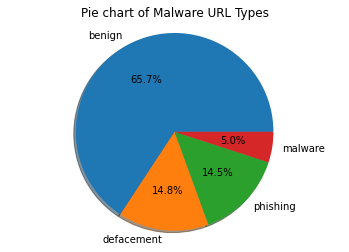

In [34]:
# Pie chart for the categorical column (type)
from colorama import Fore
plt.figure()
type_counts = df['type'].value_counts()
plt.pie(type_counts, labels=type_counts.index, autopct='%1.1f%%', shadow=True, startangle=0)
plt.title('Pie chart of Malware URL Types')
plt.axis('equal')
plt.savefig("images/url_type_count_pie")
plt.show()


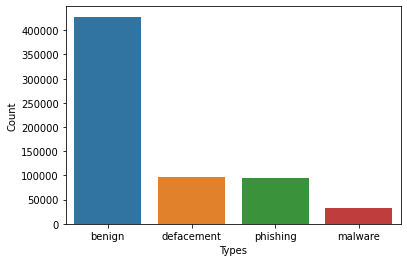

In [35]:
# URL type count plot
sns.barplot(x=count.index, y=count)
plt.xlabel('Types')
plt.ylabel('Count');
plt.savefig("images/url_type_count")
plt.show()


In [36]:
#Type count
df['type'].value_counts()

benign        428103
defacement     96457
phishing       94111
malware        32520
Name: type, dtype: int64

In [37]:
df['type'].unique()

array(['phishing', 'benign', 'defacement', 'malware'], dtype=object)

#### Plotting Wordcloud

In [38]:
from wordcloud import WordCloud
df_phish = df[df.type=='phishing']
df_malware = df[df.type=='malware']
df_deface = df[df.type=='defacement']
df_benign = df[df.type=='benign']

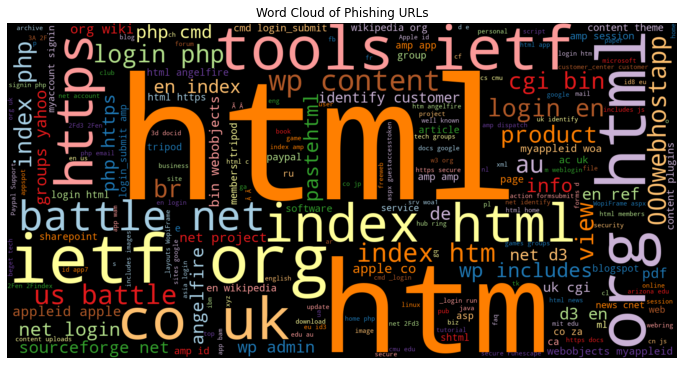

In [39]:
phish_url = " ".join(i for i in df_phish.url)
wordcloud = WordCloud(width=1600, height=800,colormap='Paired').generate(phish_url)
plt.figure( figsize=(12,14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Word Cloud of Phishing URLs', color='black')
plt.savefig("images/wordcloud-phish_url")
plt.show()

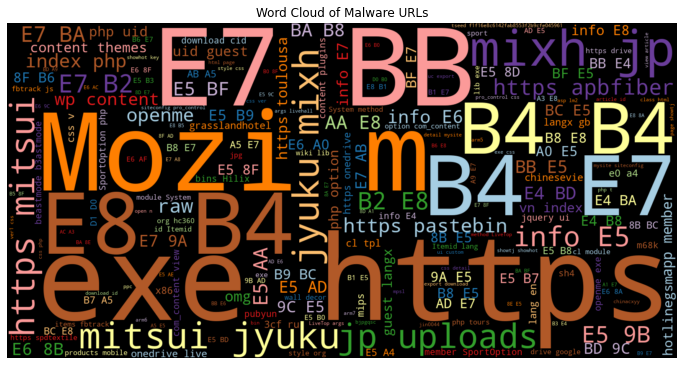

In [40]:
malware_url = " ".join(i for i in df_malware.url)
wordcloud = WordCloud(width=1600, height=800,colormap='Paired').generate(malware_url)
plt.figure( figsize=(12,14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Word Cloud of Malware URLs', color='black')
plt.savefig("images/wordcloud-malware_url")
plt.show()

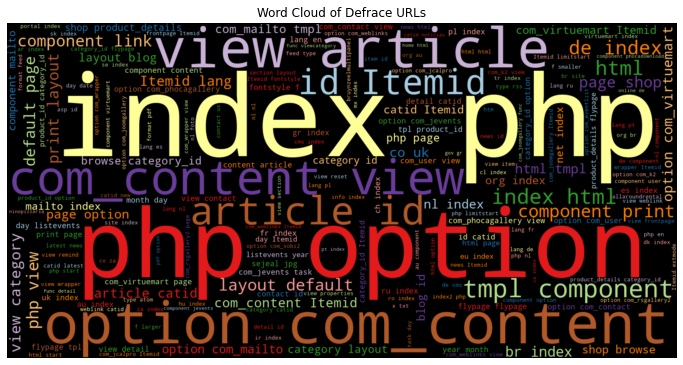

In [41]:
deface_url = " ".join(i for i in df_deface.url)
wordcloud = WordCloud(width=1600, height=800,colormap='Paired').generate(deface_url)
plt.figure( figsize=(12,14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Word Cloud of Defrace URLs', color='black')
plt.savefig("images/wordcloud-deface_url")
plt.show()

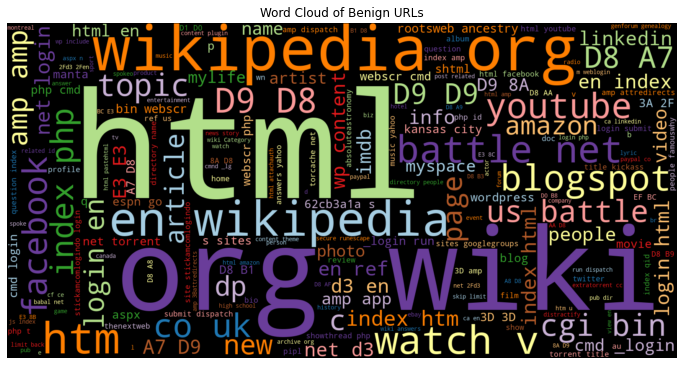

In [42]:
benign_url = " ".join(i for i in df_benign.url)
wordcloud = WordCloud(width=1600, height=800,colormap='Paired').generate(benign_url)
plt.figure( figsize=(12,14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Word Cloud of Benign URLs', color='black')
plt.savefig("images/wordcloud-benign_url")
plt.show()

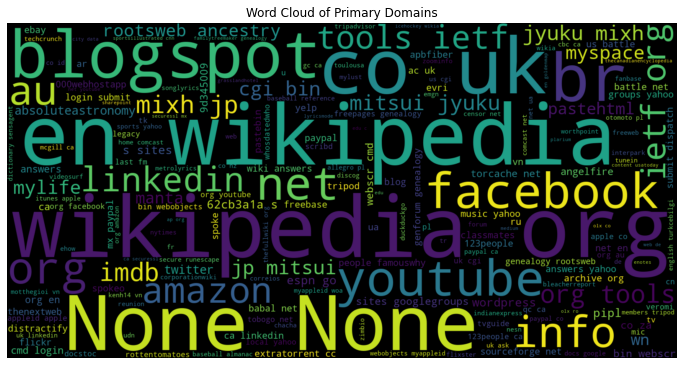

In [43]:
# Convert pri_domain values to strings and filter out None and int values
filtered_domains = df['domain'].map(str).dropna()

# Concatenate all pri_domain values into a single string
text = ' '.join(filtered_domains)

# Generate the WordCloud data
wordcloud = WordCloud( colormap='viridis', width=1600, height=800).generate(text)

# Plot the WordCloud using matplotlib
plt.figure(figsize=(12, 14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Primary Domains', color='black')
plt.savefig("images/word-cloudof-domains")
plt.show()

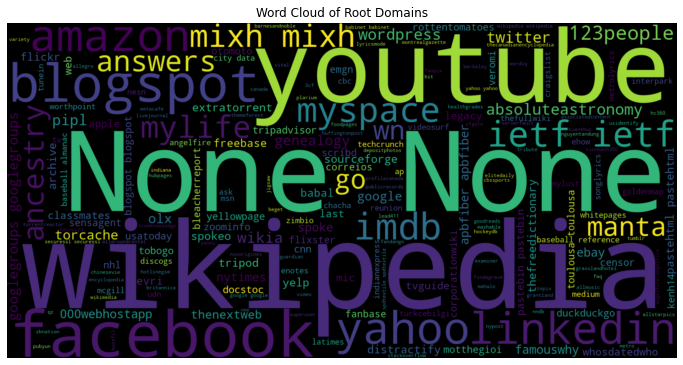

In [44]:
# Convert root_domain values to strings and filter out None and int values
filtered_domains = df['root_domain'].map(str).dropna()

# Concatenate all pri_domain values into a single string
text = ' '.join(filtered_domains)

# Generate the WordCloud data
wordcloud = WordCloud( colormap='viridis', width=1600, height=800).generate(text)

# Plot the WordCloud using matplotlib
plt.figure(figsize=(12, 14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Root Domains', color='black')
plt.savefig("images/word-cloudof-rootDomains")
plt.show()

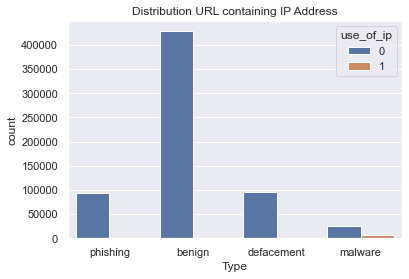

In [45]:

#Distribution of use_of_ip
sns.set(style="darkgrid")
ax = sns.countplot(x="type", data=df,hue="use_of_ip").set(xlabel='Type',title = 'Distribution URL containing IP Address')
plt.savefig("images/use_of_ip")
plt.show()

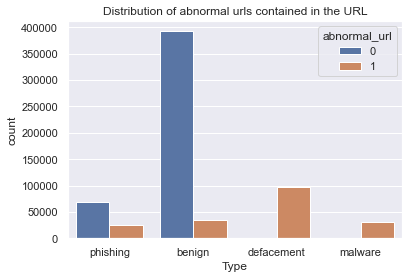

In [46]:
import seaborn as sns
# Distribution of abnormal url
sns.set(style="darkgrid")
ax = sns.countplot(x="type", data=df,hue="abnormal_url").set(xlabel='Type',title = 'Distribution of abnormal urls contained in the URL')
plt.savefig("images/abnormalurl")
plt.show()

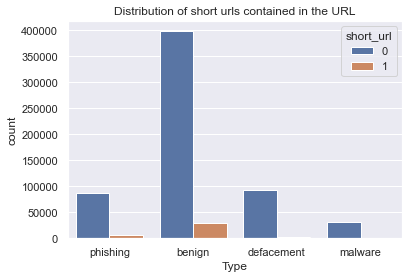

In [47]:
#Distribution of Shorl URL
sns.set(style="darkgrid")
ax = sns.countplot(x='type', data=df,hue="short_url").set(xlabel='Type',title = 'Distribution of short urls contained in the URL')
plt.savefig("images/short_url")
plt.show()

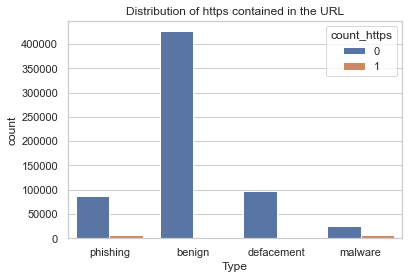

In [48]:
#https count
sns.set(style="whitegrid")
sns.countplot(hue='count_https', data=df,x='type').set(xlabel='Type',title = 'Distribution of https contained in the URL')
plt.savefig("images/https")
plt.show()

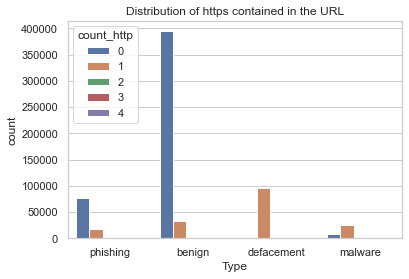

In [49]:
#https count

sns.set(style="whitegrid")
sns.countplot(hue='count_http', data=df,x='type').set(xlabel='Type',title = 'Distribution of https contained in the URL')
plt.savefig("images/http")
plt.show()

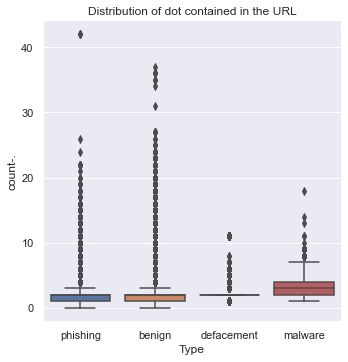

In [50]:
#Distribution of count of [.] dot
sns.set(style="darkgrid")
ax = sns.catplot(x="type", y="count-.", kind="box", data=df).set(xlabel='Type',title = 'Distribution of dot contained in the URL')
plt.savefig("images/count-dot")
plt.show()

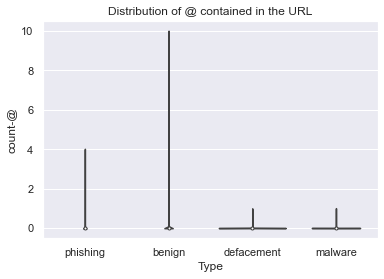

In [51]:
#Distribution of count-@
colors_list = ['#78C850', '#F08030',  '#6890F0',  '#A8B820',  '#F8D030', '#E0C068', '#C03028', '#F85888', '#98D8D8']

sns.set(style="darkgrid")
sns.violinplot(x='type', y='count-@', data=df,palette=colors_list).set(xlabel='Type',title = 'Distribution of @ contained in the URL')
plt.savefig("images/count-at")
plt.show()

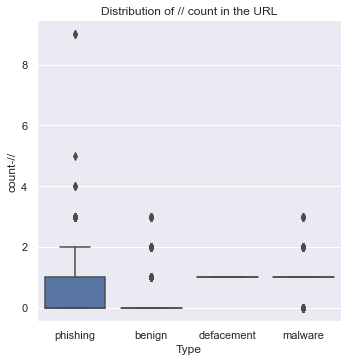

In [52]:
#Distribution of count  of directory

sns.set(style="darkgrid")
ax = sns.catplot(x="type", y="count-//", kind="box", data=df).set(xlabel='Type',title = 'Distribution of // count in the URL')
plt.savefig("images/count-dir")
plt.show()

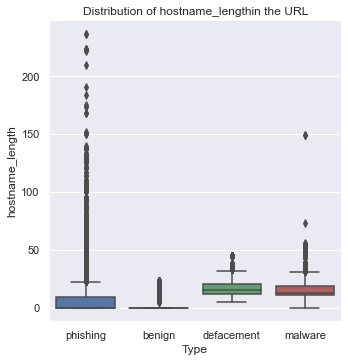

In [53]:
#. Distribution of top-level domain length
sns.set(style="darkgrid")
ax = sns.catplot(x="type", y="hostname_length", kind="box", data=df).set(xlabel='Type',title = 'Distribution of hostname_lengthin the URL')
plt.savefig("images/domain-length")
plt.show()

In [54]:
# Distribution of letters , digit count and url length
fig = px.line_3d(df, x="letters_count", y="digits_count", z="url_len", color='type')
# Add a title to the plot
fig.update_layout(title="3D Line Plot: Letters Count vs. Digits Count vs. URL Length")
# Update the layout with axis labels
fig.update_layout(
    scene=dict(
        xaxis_title="Letters Count",
        yaxis_title="Digits Count",
        zaxis_title="URL Length"
    ))
fig.write_image("images/letter-digit-rootDomainLength3d.png") 
fig.show()

In [173]:
# Count the occurrences of each region
region_counts = df['url_region'].value_counts()

# Add a count for 'Global' if it doesn't exist in the DataFrame
if 'Global' not in region_counts.index:
    region_counts['Global'] = 0

# Create a dataframe for the region counts
data = pd.DataFrame({'region': region_counts.index, 'count': region_counts.values})

# Define the colorscale for the choropleth
colorscale = 'YlOrRd'  # Change the colorscale to 'YlOrRd' for a more vibrant color scheme

# Create the Choropleth chart
fig = go.Figure(data=go.Choropleth(
    locations=data['region'],
    z=data['count'],
    locationmode='country names',
    colorscale=colorscale,
    autocolorscale=True,  # Set autocolorscale to True for vibrant colors
    marker_line_color='white',
    colorbar_title='Count'
))

# Set the chart title
fig.update_layout(
    title={
        'text': 'Distribution of URL Regions',
        'x': 0.5,
        'y': 0.9,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    geo=dict(showframe=True, showcoastlines=False)
)
fig.write_image("images/url-region-map.png")
# In case you cannot see the chropleth image on Github view it in the folder notebook/images/url-region-map.png
# Display the choropleth map
fig.show()



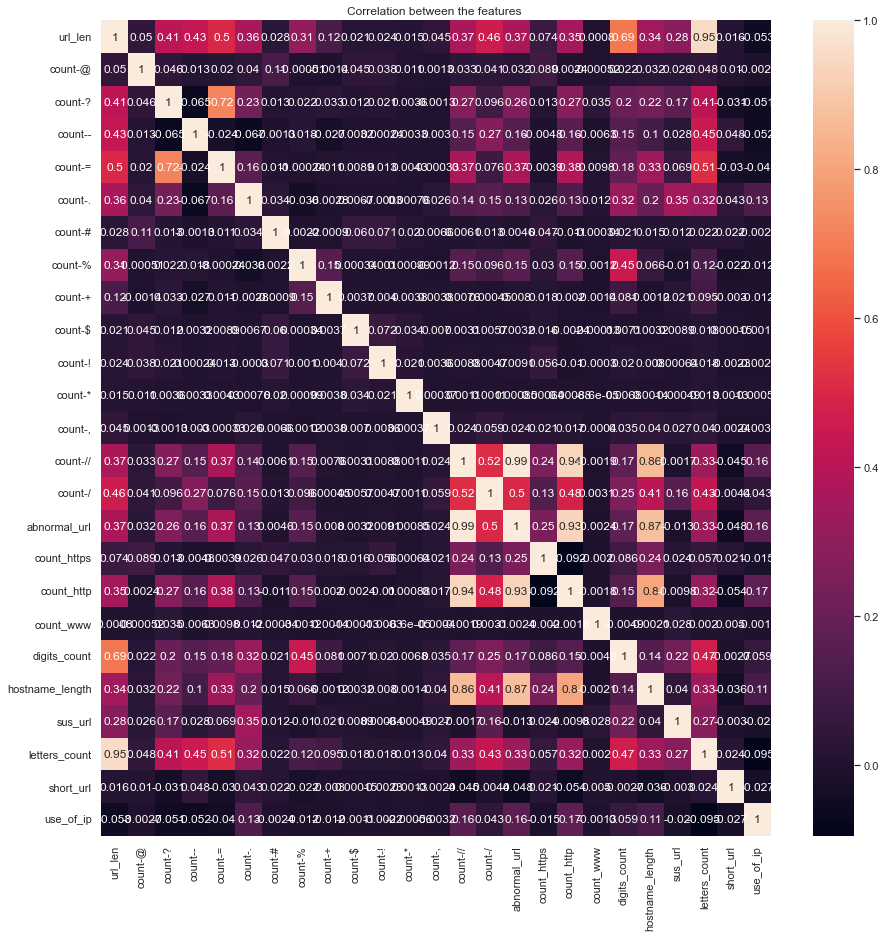

In [174]:
#Describe data and visualize it
df.corr()
plt.figure(figsize=(15, 15))
sns.heatmap(df.corr(), annot=True)
plt.title('Correlation between the features ')
plt.savefig("images/feature_corr")
plt.show()

### Target Encoding


In [175]:
df_selected=df.copy()
df_selected
df_selected = df_selected.rename(columns={'count-@': 'count_at', 'count--': 'count_hyphen','count-=': 'count_equal','count-.': 'count_dot','count-#': 'count_hash','count-%': 'count_percent','count-$': 'count_dollarsign','count-!': 'count_exlamation','count-*': 'count_star','count-,': 'count_comma','count-/': 'count_slash','count-//': 'count_double_slash','count-?':'count-question','count-+':'count_plus'})
df_selected

,url,type,category,url_len,domain,root_domain,count_at,count-question,count_hyphen,count_equal,...,count_https,count_http,count_www,digits_count,hostname_length,sus_url,letters_count,short_url,use_of_ip,url_region
0,br-icloud.com.br,phishing,phishing,16,br-icloud.com.br,br-icloud,0,0,1,0,...,0,0,0,0,0,0,13,0,0,Brazil
1,mp3raid.com/music/krizz_kaliko.html,benign,benign,35,mp3raid.com,mp3raid,0,0,0,0,...,0,0,0,1,0,0,29,0,0,Global
2,bopsecrets.org/rexroth/cr/1.htm,benign,benign,31,bopsecrets.org,bopsecrets,0,0,0,0,...,0,0,0,1,0,0,25,0,0,Global
3,http://garage-pirenne.be/index.php?option=com_...,defacement,defacement,84,garage-pirenne.be,garage-pirenne,0,1,1,4,...,0,1,0,7,17,0,60,0,0,Belgium
4,http://adventure-nicaragua.net/index.php?optio...,defacement,defacement,235,adventure-nicaragua.net,adventure-nicaragua,0,1,1,3,...,0,1,0,22,23,0,199,0,0,Global
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
651186,xbox360.ign.com/objects/850/850402.html,phishing,phishing,39,xbox360.ign.com,ign,0,0,0,0,...,0,0,0,12,0,0,21,0,0,Global
651187,games.teamxbox.com/xbox-360/1860/Dead-Space/,phishing,phishing,44,games.teamxbox.com,teamxbox,0,0,2,0,...,0,0,0,7,0,0,29,1,0,Global
651188,gamespot.com/xbox360/action/deadspace/,phishing,phishing,38,gamespot.com,gamespot,0,0,0,0,...,0,0,0,3,0,0,30,1,0,Global
651189,en.wikipedia.org/wiki/Dead_Space_(video_game),phishing,phishing,45,en.wikipedia.org,wikipedia,0,0,0,0,...,0,0,0,0,0,0,36,0,0,Global


In [176]:
from sklearn.preprocessing import LabelEncoder

lb_make = LabelEncoder()
df_selected["category"] = lb_make.fit_transform(df["type"])
df_selected["category"].value_counts()

# Apply hash LabelEncoder to url_region
df_selected["url_region"] = lb_make.fit_transform(df["url_region"])
df_selected["url_region"].value_counts()


72     515626
70      13472
190     11972
34      10851
26       8758
        ...  
52          1
94          1
7           1
20          1
43          1
Name: url_region, Length: 201, dtype: int64

In [177]:
import hashlib
def hash_encode(category):
    hash_object = hashlib.md5(category.encode())
    return int(hash_object.hexdigest(), 16) % (10 ** 8)
# Apply hash encoding to the categorical feature
df_selected['root_domain'] = df_selected['root_domain'].apply(hash_encode)
df_selected.head(5)

,url,type,category,url_len,domain,root_domain,count_at,count-question,count_hyphen,count_equal,...,count_https,count_http,count_www,digits_count,hostname_length,sus_url,letters_count,short_url,use_of_ip,url_region
0,br-icloud.com.br,phishing,3,16,br-icloud.com.br,1310791,0,0,1,0,...,0,0,0,0,0,0,13,0,0,26
1,mp3raid.com/music/krizz_kaliko.html,benign,0,35,mp3raid.com,58335668,0,0,0,0,...,0,0,0,1,0,0,29,0,0,72
2,bopsecrets.org/rexroth/cr/1.htm,benign,0,31,bopsecrets.org,28611805,0,0,0,0,...,0,0,0,1,0,0,25,0,0,72
3,http://garage-pirenne.be/index.php?option=com_...,defacement,1,84,garage-pirenne.be,89045308,0,1,1,4,...,0,1,0,7,17,0,60,0,0,18
4,http://adventure-nicaragua.net/index.php?optio...,defacement,1,235,adventure-nicaragua.net,76838614,0,1,1,3,...,0,1,0,22,23,0,199,0,0,72


In [178]:
df_selected.shape

(651191, 31)

Saving the dataframe to ../data/maliciousurl_processed.csv

In [179]:
# Saving or overwritting seelcted dataframe maliciousurl_processed.csv

df_selected.to_csv('../data/maliciousurl_processed.csv', mode='w') 

In [180]:
features = df_selected.columns[:-1]
print(features)
print('Number of features: {}'.format(len(features)))

Index(['url', 'type', 'category', 'url_len', 'domain', 'root_domain',
       'count_at', 'count-question', 'count_hyphen', 'count_equal',
       'count_dot', 'count_hash', 'count_percent', 'count_plus',
       'count_dollarsign', 'count_exlamation', 'count_star', 'count_comma',
       'count_double_slash', 'count_slash', 'abnormal_url', 'count_https',
       'count_http', 'count_www', 'digits_count', 'hostname_length', 'sus_url',
       'letters_count', 'short_url', 'use_of_ip'],
      dtype='object')
Number of features: 30


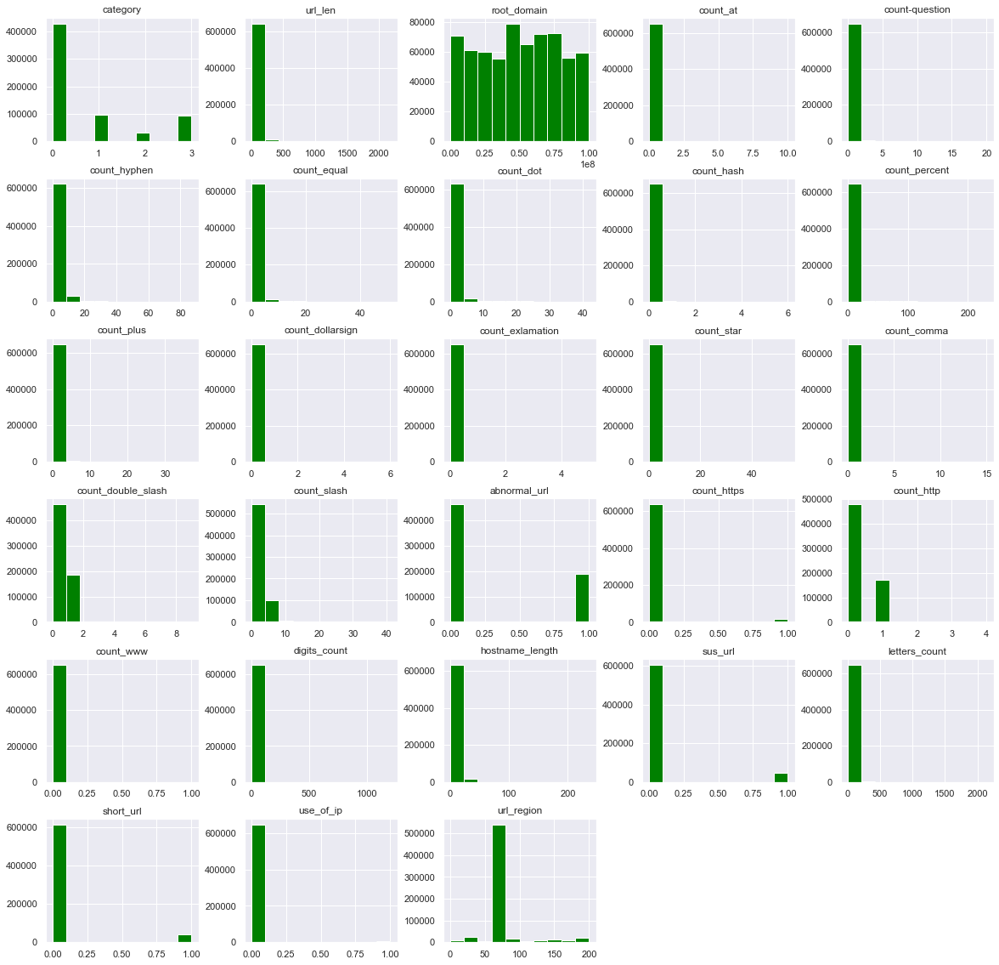

In [181]:
# Histograms of each attribute
df_selected.hist(figsize=(20, 20), color="green")
plt.savefig("images/alldatahist")
plt.show()

### Inference:


Inference
I started with two features, url and type and after processing the data I was abe to extract 30 features. The numeric feature would be used for modelling. 